In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

Using TensorFlow backend.
c:\users\sreshta\appdata\local\programs\python\python36\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.py:541: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
c:\users\sreshta\appdata\local\programs\python\python36\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.py:542: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
c:\users\sreshta\appdata\local\programs\python\python36\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.py:543: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np

In [2]:
numpy.random.seed(7)

In [4]:
import requests
url = "http://183.82.112.181:3402/Trans/overview/868997035786613/all"
#user = "admin"
#passwd = "admin@123"
#auth_values = (user, passwd)
response = requests.get(url)
print(response.json())

[{'A_id': 986505, 'EventId': 1, 'DeviceImei': '868997035786613', 'DeviceTimeStamp': '2020-04-14T00:30:00', 'OTI': '30', 'WTI': '1', 'ATI': '28', 'OLI': '100', 'MachineName': 'TRIPURA 1', 'OTI_A': 0, 'OTI_T': 0, 'WTI_A': 0, 'WTI_T': 0, 'GOR_A': 0, 'GOR_T': 0, 'MOG_A': 0, 'SR_T': 0, 'PRV_T': 0, 'OLTC_WTI': '0', 'HUM': '0', 'OLTCSURGE': '0', 'OLTC_PRV': '0', 'FAN1': '0', 'FAN2': '0', 'IN1': '0', 'IN2': '0', 'OUT1': '0', 'OUT2': '0', 'OUT3': '0', 'OUT4': '0', 'OUT5': None, 'Pressure': None, 'GridStatus': None, 'ROilT': None, 'RWindT': None, 'RAmbT': None}, {'A_id': 986500, 'EventId': 1, 'DeviceImei': '868997035786613', 'DeviceTimeStamp': '2020-04-14T00:15:00', 'OTI': '30', 'WTI': '1', 'ATI': '28', 'OLI': '100', 'MachineName': 'TRIPURA 1', 'OTI_A': 0, 'OTI_T': 0, 'WTI_A': 0, 'WTI_T': 0, 'GOR_A': 0, 'GOR_T': 0, 'MOG_A': 0, 'SR_T': 0, 'PRV_T': 0, 'OLTC_WTI': '0', 'HUM': '0', 'OLTCSURGE': '0', 'OLTC_PRV': '0', 'FAN1': '0', 'FAN2': '0', 'IN1': '0', 'IN2': '0', 'OUT1': '0', 'OUT2': '0', 'OUT3': 

In [5]:
import pandas as pd
lis=response.json()
head=list(lis[0].keys())
head
rawdata=[]
for i in range(0, len(lis)):
    l=[]
    for x in head:
        if(x=='DeviceImei' or x=='MachineName' or x=='DeviceTimeStamp' or x== 'OUT5' or x=='Pressure' or x== 'GridStatus' or x== 'ROilT' or x=='RWindT' or x== 'RAmbT'):
            l.append(lis[i][x])
        else:
            l.append(float(lis[i][x]))
    rawdata.append(l)
    #rint(lis[0][x], type(lis[0][x]))
def Reverse(lst): 
    return [ele for ele in reversed(lst)] 
data=Reverse(rawdata)
print(data)

[[797955.0, 1.0, '868997035786613', '2019-06-25T13:06:10', 0.0, 0.0, 0.0, 37.0, '', 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, None, None, None, None, None, None], [797967.0, 1.0, '868997035786613', '2019-06-25T13:09:19', 0.0, 0.0, 0.0, 37.0, '', 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, None, None, None, None, None, None], [799482.0, 1.0, '868997035786613', '2019-06-27T10:49:47', 0.0, 0.0, 0.0, 38.0, '', 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, None, None, None, None, None, None], [799486.0, 1.0, '868997035786613', '2019-06-27T10:51:34', 0.0, 0.0, 0.0, 38.0, 'TRIPURA TEST 3', 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, None, None, None, None, None, None], [799489.0, 1.0, '868997035786613', '2019-06-27T10:52:00', 0.0, 0.0, 0.0, 39.0, 'TRIPU

In [71]:
df = pd.DataFrame(data, columns=head)
df

,A_id,EventId,DeviceImei,DeviceTimeStamp,OTI,WTI,ATI,OLI,MachineName,OTI_A,...,OUT1,OUT2,OUT3,OUT4,OUT5,Pressure,GridStatus,ROilT,RWindT,RAmbT
0,797955.0,1.0,868997035786613,2019-06-25T13:06:10,0.0,0.0,0.0,37.0,,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
1,797967.0,1.0,868997035786613,2019-06-25T13:09:19,0.0,0.0,0.0,37.0,,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
2,799482.0,1.0,868997035786613,2019-06-27T10:49:47,0.0,0.0,0.0,38.0,,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
3,799486.0,1.0,868997035786613,2019-06-27T10:51:34,0.0,0.0,0.0,38.0,TRIPURA TEST 3,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
4,799489.0,1.0,868997035786613,2019-06-27T10:52:00,0.0,0.0,0.0,39.0,TRIPURA TEST 3,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20311,986486.0,1.0,868997035786613,2020-04-13T23:30:01,31.0,1.0,28.0,100.0,TRIPURA 1,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
20312,986490.0,1.0,868997035786613,2020-04-13T23:45:00,31.0,1.0,28.0,100.0,TRIPURA 1,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
20313,986495.0,1.0,868997035786613,2020-04-14T00:00:00,31.0,1.0,28.0,100.0,TRIPURA 1,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
20314,986500.0,1.0,868997035786613,2020-04-14T00:15:00,30.0,1.0,28.0,100.0,TRIPURA 1,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None


,A_id,EventId,DeviceImei,OTI,WTI,ATI,OLI,MachineName,OTI_A,OTI_T,...,OUT1,OUT2,OUT3,OUT4,OUT5,Pressure,GridStatus,ROilT,RWindT,RAmbT
0,797955.0,1.0,868997035786613,0.0,0.0,0.0,37.0,,0.0,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
1,797967.0,1.0,868997035786613,0.0,0.0,0.0,37.0,,0.0,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
2,799482.0,1.0,868997035786613,0.0,0.0,0.0,38.0,,0.0,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
3,799486.0,1.0,868997035786613,0.0,0.0,0.0,38.0,TRIPURA TEST 3,0.0,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
4,799489.0,1.0,868997035786613,0.0,0.0,0.0,39.0,TRIPURA TEST 3,0.0,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20311,986486.0,1.0,868997035786613,31.0,1.0,28.0,100.0,TRIPURA 1,0.0,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
20312,986490.0,1.0,868997035786613,31.0,1.0,28.0,100.0,TRIPURA 1,0.0,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
20313,986495.0,1.0,868997035786613,31.0,1.0,28.0,100.0,TRIPURA 1,0.0,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None
20314,986500.0,1.0,868997035786613,30.0,1.0,28.0,100.0,TRIPURA 1,0.0,0.0,...,0.0,0.0,0.0,0.0,None,None,None,None,None,None


In [74]:
df=df.loc[0:1000000,['DeviceTimeStamp', 'OTI']]

In [75]:
df1=df.loc[0:1000000,['OTI']]

In [85]:
df2=df.loc[0:1000000,['DeviceTimeStamp']]

In [86]:
df2['DeviceTimeStamp'] = pd.to_datetime(df['DeviceTimeStamp'])

In [76]:
dataset = df1.values
dataset = dataset.astype('float32')

In [77]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)

In [78]:
# split into train and test sets
train_size = int(len(dataset) * 0.67)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
print(len(train), len(test))

13611 6705


In [79]:

# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-look_back-1):
		a = dataset[i:(i+look_back), 0]
		dataX.append(a)
		dataY.append(dataset[i + look_back, 0])
	return numpy.array(dataX), numpy.array(dataY)

In [80]:

# reshape into X=t and Y=t+1
look_back = 1
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

In [81]:
# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

In [82]:
# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

Epoch 1/100
 - 16s - loss: 0.0017
Epoch 2/100
 - 15s - loss: 9.5297e-04
Epoch 3/100
 - 16s - loss: 9.5322e-04
Epoch 4/100
 - 15s - loss: 9.4154e-04
Epoch 5/100
 - 15s - loss: 9.4963e-04
Epoch 6/100
 - 16s - loss: 9.3511e-04
Epoch 7/100
 - 16s - loss: 9.3228e-04
Epoch 8/100
 - 16s - loss: 9.2408e-04
Epoch 9/100
 - 15s - loss: 9.2561e-04
Epoch 10/100
 - 15s - loss: 9.2791e-04
Epoch 11/100
 - 15s - loss: 9.2792e-04
Epoch 12/100
 - 15s - loss: 9.2602e-04
Epoch 13/100
 - 14s - loss: 9.3741e-04
Epoch 14/100
 - 15s - loss: 9.2862e-04
Epoch 15/100
 - 15s - loss: 8.9846e-04
Epoch 16/100
 - 16s - loss: 9.3929e-04
Epoch 17/100
 - 16s - loss: 9.2995e-04
Epoch 18/100
 - 15s - loss: 9.2830e-04
Epoch 19/100
 - 15s - loss: 9.2982e-04
Epoch 20/100
 - 15s - loss: 9.3797e-04
Epoch 21/100
 - 16s - loss: 9.3130e-04
Epoch 22/100
 - 18s - loss: 9.2849e-04
Epoch 23/100
 - 16s - loss: 9.2252e-04
Epoch 24/100
 - 16s - loss: 9.3497e-04
Epoch 25/100
 - 16s - loss: 9.1949e-04
Epoch 26/100
 - 16s - loss: 9.3041e-04

In [83]:
# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 7.46 RMSE
Test Score: 1.22 RMSE


In [44]:
pred1=pd.DataFrame(testPredict)

In [45]:
pred1

,0
0,23.831739
1,23.831739
2,21.828770
3,22.829681
4,22.829681
...,...
6698,30.875488
6699,30.875488
6700,30.875488
6701,30.875488


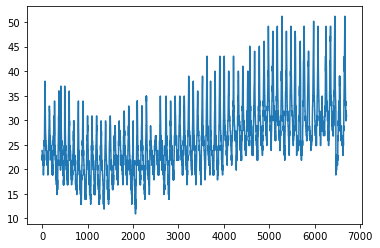

In [46]:
plt.plot(pred1)

In [47]:
pred=pred1[0].values.tolist()

In [60]:
#to find confidence intervals
import math
rolling_mean=0
grand=0
sum_sq=0
n=1
z=1.96
low=[]
up=[]
for i in range(0, len(pred)):
    grand+=pred[i]
    rolling_mean=grand/n
    sum_sq+=(pred[i]-rolling_mean)*(pred[i]-rolling_mean)
    sigma=math.sqrt(sum_sq/n)
    low1=rolling_mean-z*(sigma/math.sqrt(n))
    high=rolling_mean+z*(sigma/math.sqrt(n))
    low.append(low1)
    up.append(high)
    n+=1
    


In [61]:
lower=pd.DataFrame(low)
lower

,0
0,23.831739
1,23.831739
2,22.291678
3,22.414738
4,22.491951
...,...
6698,26.447643
6699,26.448299
6700,26.448955
6701,26.449611


In [62]:
upper=pd.DataFrame(up)
upper

,0
0,23.831739
1,23.831739
2,24.036487
3,23.746227
4,23.568694
...,...
6698,26.780586
6699,26.781202
6700,26.781817
6701,26.782433


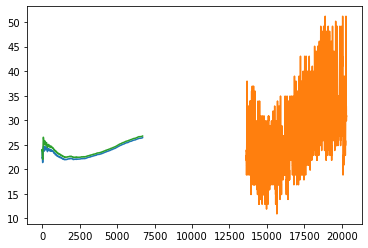

In [63]:
plt.plot(lower)
plt.plot(testPredictPlot)
plt.plot(upper)

In [28]:
from scipy.optimize import minimize
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import numpy as np

In [29]:
import seaborn as sns

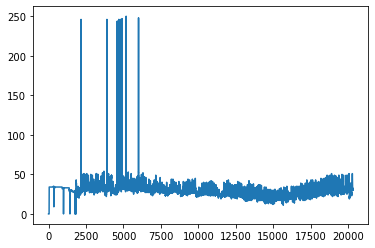

In [33]:
plt.plot(scaler.inverse_transform(dataset))

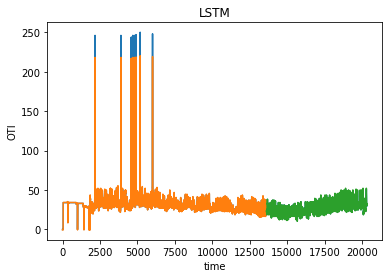

In [84]:
# shift train predictions for plotting
plt.title("LSTM")
plt.xlabel("time")
plt.ylabel("OTI")
trainPredictPlot = numpy.empty_like(dataset)
trainPredictPlot[:, :] = numpy.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = numpy.empty_like(dataset)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(dataset))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

In [66]:
trainpp=pd.DataFrame(trainPredictPlot)

In [67]:
trainpp

,0
0,NaN
1,0.178337
2,0.178337
3,0.178337
4,0.178337
...,...
20311,NaN
20312,NaN
20313,NaN
20314,NaN


In [87]:
trn = df2.merge(trainpp, left_index=True, right_index=True)

In [89]:
trn = trn.set_index('DeviceTimeStamp')
trn

,0
DeviceTimeStamp,
2019-06-25 13:06:10,NaN
2019-06-25 13:09:19,0.178337
2019-06-27 10:49:47,0.178337
2019-06-27 10:51:34,0.178337
2019-06-27 10:52:00,0.178337
...,...
2020-04-13 23:30:01,NaN
2020-04-13 23:45:00,NaN
2020-04-14 00:00:00,NaN


In [68]:
testpp=pd.DataFrame(testPredictPlot)
testpp

,0
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
20311,30.875488
20312,30.875488
20313,30.875488
20314,30.875488


In [90]:
pred = df2.merge(testpp, left_index=True, right_index=True)

In [91]:
pred = pred.set_index('DeviceTimeStamp')
pred

,0
DeviceTimeStamp,
2019-06-25 13:06:10,NaN
2019-06-25 13:09:19,NaN
2019-06-27 10:49:47,NaN
2019-06-27 10:51:34,NaN
2019-06-27 10:52:00,NaN
...,...
2020-04-13 23:30:01,30.875488
2020-04-13 23:45:00,30.875488
2020-04-14 00:00:00,30.875488


In [96]:
orig=df2.merge(df1, left_index=True, right_index=True)
orig=orig.set_index('DeviceTimeStamp')

In [97]:
orig

,OTI
DeviceTimeStamp,
2019-06-25 13:06:10,0.0
2019-06-25 13:09:19,0.0
2019-06-27 10:49:47,0.0
2019-06-27 10:51:34,0.0
2019-06-27 10:52:00,0.0
...,...
2020-04-13 23:30:01,31.0
2020-04-13 23:45:00,31.0
2020-04-14 00:00:00,31.0


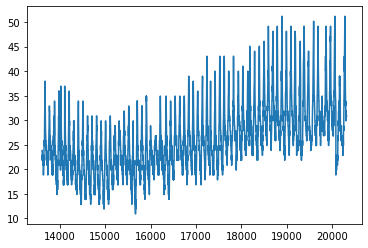

In [34]:
plt.plot(testPredictPlot)

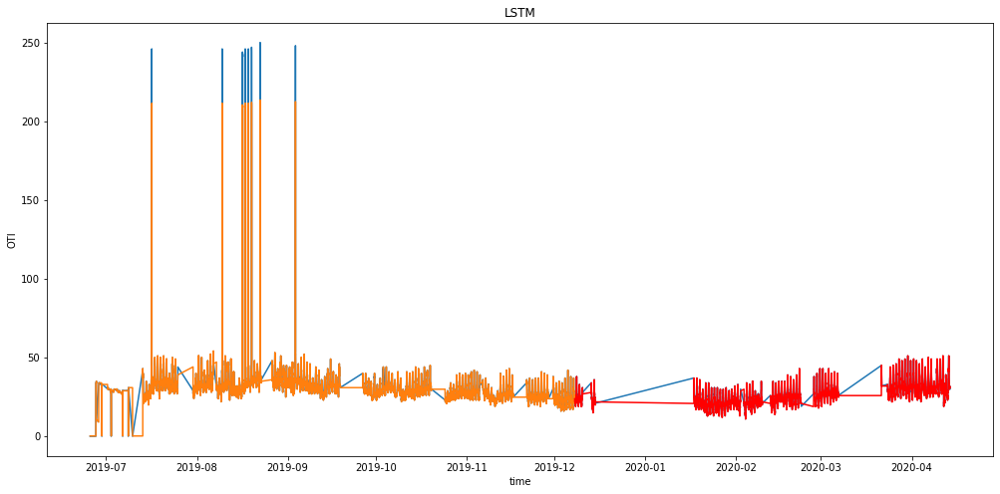

In [98]:
plt.figure(figsize=(17,8))

plt.title("LSTM")
plt.xlabel("time")
plt.ylabel("OTI")
plt.plot(orig, label='Original')
plt.plot(trn, label='Training')
#plt.plot(ub, color='Grey', label='Upper Bound' )
#plt.plot(lb, color='Grey', label='Lower Bound' )
plt.plot(pred, color='Red', label='Predicted')